# Présentation du projet

Projet du cours d'Introduction au Machine Learning pour l'Image (IMLI)<br>
Promo : IMAGE 2024<br>
Enseignants : Guillaume Tochon & Joseph Chazalon

# Classification de Pixels sur Images Hyperspectrales et LiDAR

Dans ce projet, nous effectuons une classification de pixels sur des images hyperspectrales et LiDAR pour identifier les classes d'objets (de 1 à 15) auxquelles ils appartiennent.

Nous commencerons par prétraiter les images hyperspectrales et LiDAR, en appliquant des techniques pour normaliser les données, supprimer les nuages et effectuer une égalisation d'histogramme. Ensuite, nous sélectionnerons les meilleures bandes en utilisant des mesures de corrélation et de variance pour réduire la redondance et maximiser l'information disponible. Après cela, nous testerons plusieurs modèles de classification et choisirons le meilleur en fonction de leur performance. Enfin, nous utiliserons le modèle sélectionné pour prédire les classes d'objets dans les images.

## Sommaire

### 1. Prétraitement
- **Normalisation des données**
- **Suppression des nuages**
    - Calcul des différences entre les valeurs moyennes des pixels nuageux et non nuageux
    - Génération d'un masque binaire pour les nuages
    - Filtrage et opérations morphologiques pour améliorer la cohérence spatiale du masque
- **Égalisation d'histogramme**

### 2. Sélection des meilleures bandes
- **Calcul de la corrélation entre les bandes**
- **Calcul de la variance pour chaque bande**
- **Sélection des bandes basées sur la corrélation et la variance**

### 3. Test de plusieurs modèles de classification
- **Entraînement de différents modèles de classification** tels que SVM, Random Forest Classifier, k-NN
- **Évaluation des performances de chaque modèle**
- **Comparaison des résultats obtenus par chaque modèle**

### 4. Choix du meilleur modèle

### 5. Prédiction du résultat final avec le modèle sélectionné

## Importation des bibliothèques nécessaires

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from scipy import io
from tqdm import tqdm
import seaborn as sns
from sklearn.model_selection import train_test_split, KFold

## Chargement des images hyperspectrales et LiDAR

In [4]:
data = sp.io.loadmat('data/2013_DFC_contest.mat')
lidar = data['lidar']
hsi_raw = data['hyper']
groundtruth = np.load('groundtruth/groundtruth.npy')
groundtruth_info = np.load('groundtruth/groundtruth_info.npy', allow_pickle=True)
groundtruth_rgb = plt.imread('groundtruth/groundtruth.png')

print("L'image LiDAR est composée de %d lignes et %d colonnes au format %s" % (lidar.shape[0], lidar.shape[1], lidar.dtype))
print("L'image hyperspectrale est composée de %d lignes, %d colonnes et %d bandes au format %s" % (hsi_raw.shape[0], hsi_raw.shape[1], hsi_raw.shape[2], hsi_raw.dtype))

L'image LiDAR est composée de 349 lignes et 1905 colonnes au format float32
L'image hyperspectrale est composée de 349 lignes, 1905 colonnes et 144 bandes au format uint16


## Visualisation des données

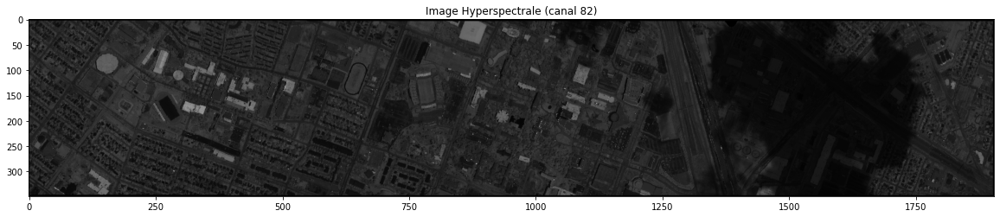

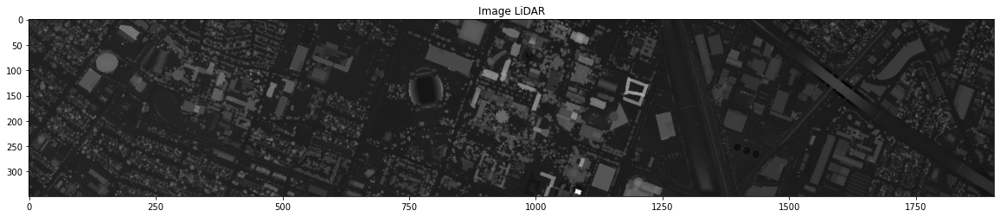

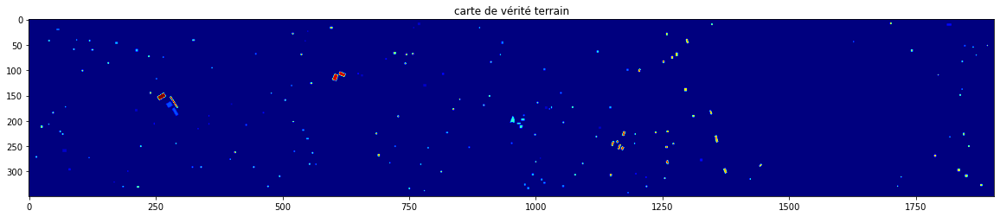

In [5]:
# Affichage d'un canal spécifique de l'image hyperspectrale
plt.figure(figsize=(20,5))
plt.imshow(hsi_raw[:, :, 82], cmap='gray')
plt.title("Image Hyperspectrale (canal 82)")
plt.show()

plt.figure(figsize=(20,5))

# Affichage de l'image LiDAR
plt.imshow(lidar, cmap='gray')
plt.title("Image LiDAR")
plt.show()

plt.figure(figsize=(20,5))
plt.title('carte de vérité terrain')
plt.imshow(groundtruth, cmap='jet')
plt.show()

# Prétraitement des données

## Création d'un premier masque de nuages et sélection des meilleures bandes

Pour commencer, nous créons un premier masque de nuages en utilisant des bandes aléatoires. Ce masque initial nous permet d'identifier approximativement les zones nuageuses et les zones sans nuages dans l'image. Ensuite, nous calculons la différence entre les valeurs moyennes des pixels nuageux et des pixels non nuageux pour chaque bande de l'image hyperspectrale. Cette étape nous aide à sélectionner les bandes qui présentent les plus grandes différences entre les zones nuageuses et les zones sans nuages, permettant ainsi une meilleure identification des nuages.

In [6]:
from skimage.morphology import opening, closing, disk, square, disk
from skimage.filters import median
from skimage.filters import threshold_otsu

def calculate_band_differences(hsi_data, cloud_mask):
    band_differences = []

    for band in range(hsi_data.shape[2]):
        band_data = hsi_data[:, :, band]
        cloud_mean = np.mean(band_data[cloud_mask])
        non_cloud_mean = np.mean(band_data[~cloud_mask])
        difference = abs(cloud_mean - non_cloud_mean)
        band_differences.append(difference)

    return band_differences

def find_cloud_mask(hsi_data, relevant_bands, otsu_factor=0.7):
    # Calculer le seuil d'Otsu pour chaque bande pertinente
    thresholds = [threshold_otsu(hsi_data[:,:,band]) for band in relevant_bands]
    
    # Prendre un pourcentage du seuil d'Otsu
    thresholds = [threshold * otsu_factor for threshold in thresholds]
    
    # Créer un masque de nuage en combinant les seuils de toutes les bandes pertinentes
    cloud_mask = np.zeros_like(hsi_data[:,:,0], dtype=bool)
    for band, threshold in zip(relevant_bands, thresholds):
        cloud_mask |= (hsi_data[:,:,band] > threshold)
    
    return cloud_mask

def salt_pepper_filter_with_morphology(mask, salt_pepper_strength=60, opening_size=15, closing_size=15):
    # Appliquer le filtre médian pour réduire le bruit sel et poivre
    filtered_mask = median(mask, footprint=square(salt_pepper_strength))

    for i in range(3):
        # Appliquer l'ouverture pour supprimer le bruit blanc et les petits objets
        filtered_mask = opening(filtered_mask, footprint=disk(opening_size))
        # Appliquer la fermeture pour combler les petits trous dans les objets
        filtered_mask = closing(filtered_mask, footprint=disk(closing_size))

    return filtered_mask

### Affichage de quelques bandes

[106  79 109 102 108 104 107 101 105  92  93  91  90  80  89  81  86  82
  88  87]


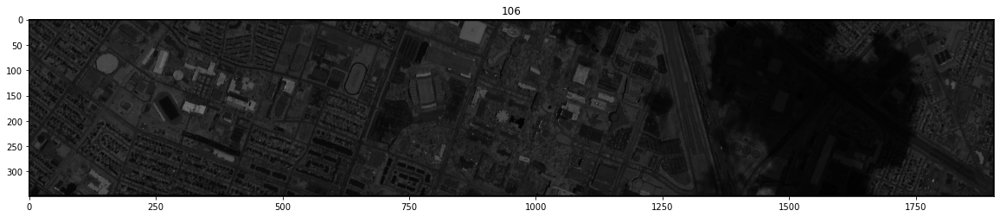

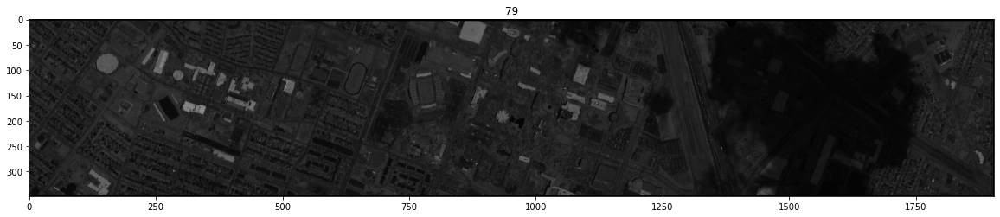

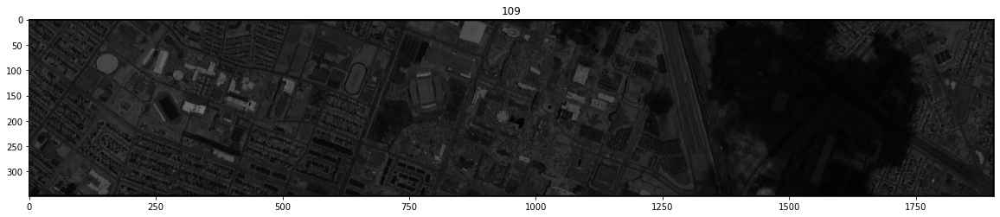

In [7]:
cloud_mask = find_cloud_mask(hsi_raw, relevant_bands=[54, 32, 18, 82, 106, 16, 1, 140, 14, 130, 128, 11, 9])
cloud_mask_filtered = salt_pepper_filter_with_morphology(cloud_mask)

band_differences = calculate_band_differences(hsi_raw, cloud_mask_filtered)
num_top_bands = 20
band_indices = np.argsort(band_differences)[-num_top_bands:]
selected_bands = hsi_raw[:, :, band_indices]

print(band_indices)

for i in range(int(selected_bands.shape[2]/6)):
    plt.figure(figsize=(20, 5))
    plt.imshow(selected_bands[:,:,i], cmap='gray')
    plt.title(band_indices[i])
    plt.show()

## Égalisation d'histogramme et normalisation

Une fois les meilleures bandes sélectionnées, nous égalisons les histogrammes de la zone nuageuse et de la zone sans nuages indépendamment les uns des autres. Cette étape permet d'améliorer le contraste et la distribution des valeurs des pixels, ce qui peut améliorer la performance de la classification.

In [8]:
from skimage import exposure

def normalize_zones(hsi_data, cloud_mask, cloud=True, plot=True):
    hsi_data_normalized = np.copy(hsi_data)
    for band in tqdm(range(hsi_data.shape[2])):
        band_data = hsi_data[:, :, band]
        band_data_normalized = np.copy(band_data)
        if (cloud):
            band_data_normalized[~cloud_mask] = exposure.equalize_hist(band_data[~cloud_mask]) * np.amax(band_data)
            band_data_normalized[cloud_mask] = exposure.equalize_hist(band_data[cloud_mask]) * np.amax(band_data)
        else:
            band_data_normalized = exposure.equalize_hist(band_data) * np.amax(band_data)
        hsi_data_normalized[:, :, band] = band_data_normalized
    
    if (plot):
        random_band = np.random.randint(hsi_data_normalized.shape[2])
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.hist(hsi_data[:, :, random_band].flatten(), bins=50, color='blue', alpha=0.7)
        plt.title(f"Histogramme avant égalisation de la bande {random_band}")
        plt.subplot(1, 2, 2)
        plt.hist(hsi_data_normalized[:, :, random_band].flatten(), bins=50, color='blue', alpha=0.7)
        plt.title(f"Histogramme après égalisation de la bande {random_band}")
        plt.show()
    return hsi_data_normalized

In [9]:
def normalize_data(data):
    return (data - data.min()) / (data.max() - data.min())

100%|██████████| 144/144 [00:11<00:00, 12.42it/s]


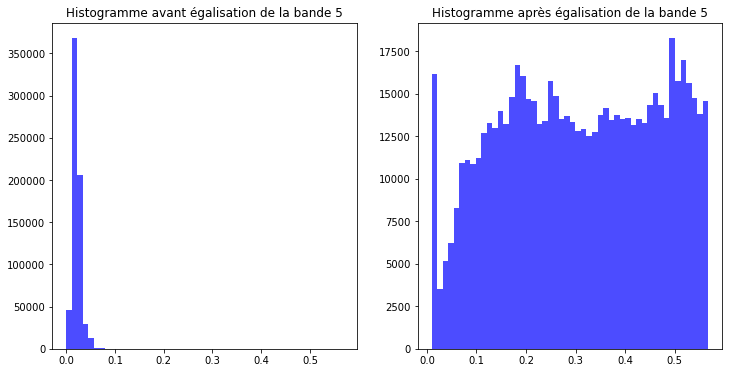

In [10]:
cloud_mask = find_cloud_mask(hsi_raw, relevant_bands=band_indices)
cloud_mask_filtered = salt_pepper_filter_with_morphology(cloud_mask)

hsi_normalized = normalize_data(hsi_raw)
hsi_whithout_cloud = normalize_zones(hsi_normalized, cloud_mask_filtered, cloud=False, plot=False)
hsi_data_normalized = normalize_zones(hsi_normalized, cloud_mask_filtered)

## Affichage des résultats sur deux bandes aléatoires

Après avoir effectué les étapes précédentes, nous visualisons les résultats sur deux bandes aléatoires pour vérifier l'efficacité de notre prétraitement et de notre sélection de bandes.

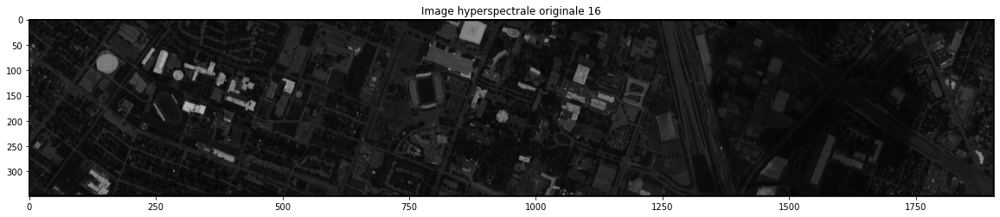

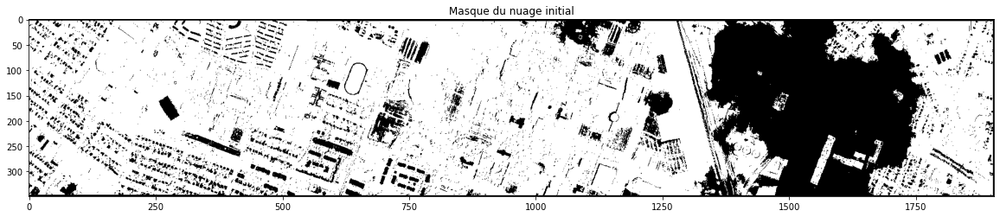

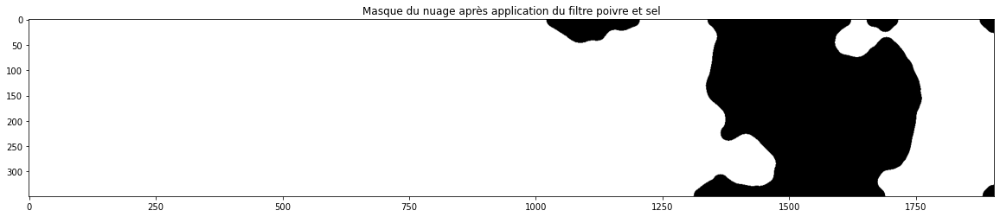

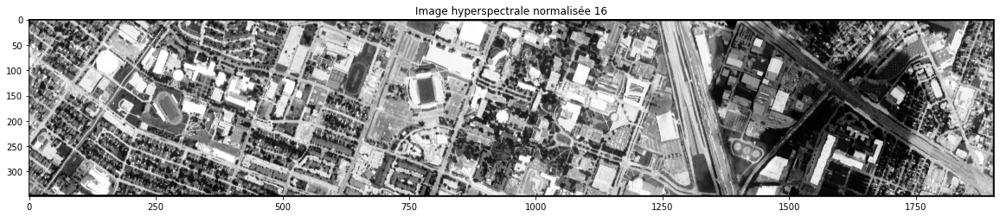

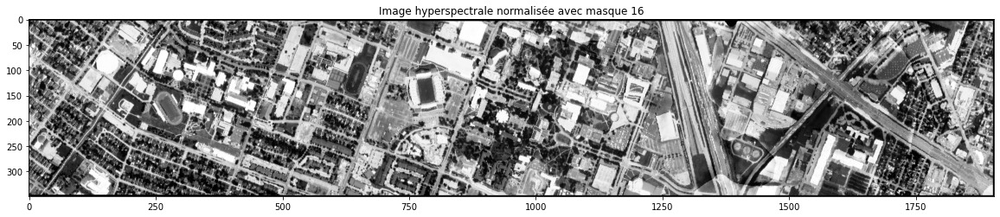

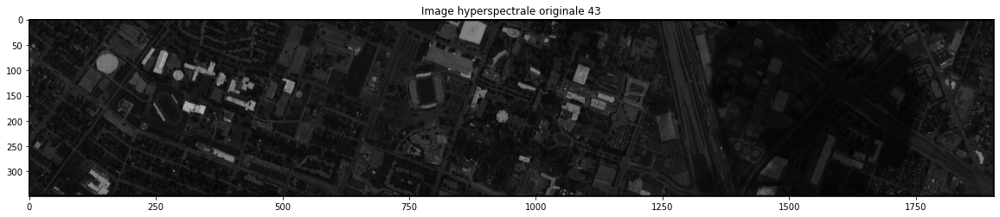

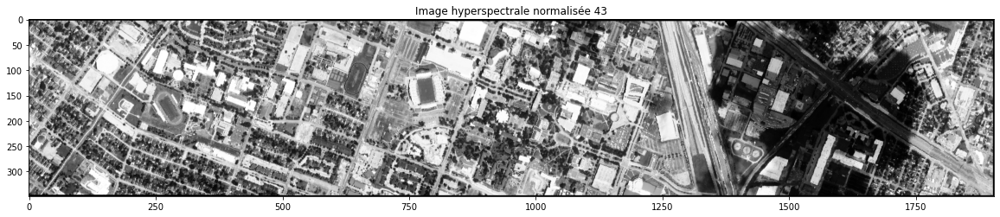

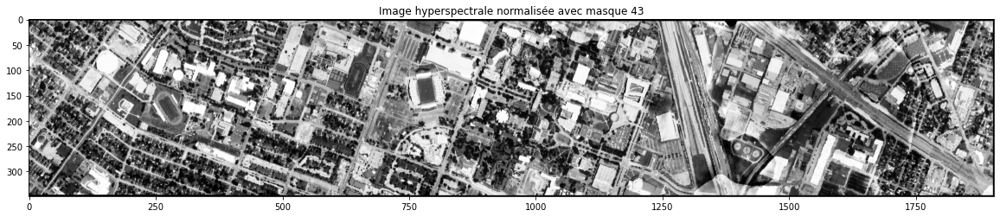

In [11]:
random_band = 28
plt.figure(figsize=(20, 5))
plt.imshow(hsi_raw[:,:,random_band], cmap='gray')
plt.title("Image hyperspectrale originale 16")
plt.show()

plt.figure(figsize=(20, 5))
plt.imshow(cloud_mask, cmap='gray')
plt.title("Masque du nuage initial")
plt.show()

plt.figure(figsize=(20, 5))
plt.imshow(cloud_mask_filtered, cmap='gray')
plt.title("Masque du nuage après application du filtre poivre et sel")
plt.show()

plt.figure(figsize=(20, 5))
plt.imshow(hsi_whithout_cloud[:,:,random_band], cmap='gray')
plt.title("Image hyperspectrale normalisée 16")
plt.show()

plt.figure(figsize=(20, 5))
plt.imshow(hsi_data_normalized[:,:,random_band], cmap='gray')
plt.title("Image hyperspectrale normalisée avec masque 16")
plt.show()

plt.figure(figsize=(20, 5))
plt.imshow(hsi_raw[:,:,43], cmap='gray')
plt.title("Image hyperspectrale originale 43")
plt.show()

plt.figure(figsize=(20, 5))
plt.imshow(hsi_whithout_cloud[:,:,43], cmap='gray')
plt.title("Image hyperspectrale normalisée 43")
plt.show()

plt.figure(figsize=(20, 5))
plt.imshow(hsi_data_normalized[:,:,43], cmap='gray')
plt.title("Image hyperspectrale normalisée avec masque 43")
plt.show()

# Sélection des meilleures bandes

Pour sélectionner les meilleures bandes, nous utilisons les mesures de corrélation et de variance :
- **Calcul de la corrélation entre les bandes** : La corrélation entre les bandes donne une indication de la similarité entre les informations contenues dans ces bandes. Une corrélation élevée signifie que les informations contenues dans les deux bandes sont très similaires, ce qui peut être redondant pour l'analyse. En revanche, une corrélation faible signifie que les bandes contiennent des informations différentes, ce qui est intéressant pour l'analyse et la classification. En utilisant la corrélation moyenne, on essaie de minimiser la redondance entre les bandes sélectionnées.

- **Calcul de la variance pour chaque bande** : La variance mesure la dispersion des valeurs dans une bande. Une bande avec une variance élevée contient des valeurs plus étalées, ce qui peut indiquer un niveau d'information plus élevé. Une bande avec une faible variance est dominée par des valeurs similaires, ce qui peut indiquer un niveau d'information plus faible. En utilisant la variance, on cherche à sélectionner des bandes qui contiennent des informations plus variées.

- **Combinaison des mesures pour sélectionner les bandes** : La mesure combinée est calculée en multipliant la variance normalisée par (1 - corrélation moyenne normalisée). Cette formule permet de sélectionner des bandes qui présentent à la fois une variance élevée (information variée) et une corrélation moyenne faible (informations différentes entre les bandes).

In [12]:
def combined_band_selection(hyperspectral_image):
    transposed_image = np.transpose(hyperspectral_image, (2, 0, 1))
    num_bands = transposed_image.shape[0]
    flattened_bands = [np.reshape(transposed_image[i], -1) for i in range(num_bands)]
    correlation_matrix = np.corrcoef(flattened_bands)
    
    average_correlations = np.mean(correlation_matrix, axis=1)
    variances = np.array([np.var(band) for band in flattened_bands])
    variances_normalized = (variances - np.min(variances)) / (np.max(variances) - np.min(variances))
    average_correlations_normalized = (average_correlations - np.min(average_correlations)) / (np.max(average_correlations) - np.min(average_correlations))
    combined_measure = variances_normalized * (1 - average_correlations_normalized)
    
    sorted_band_indices = np.argsort(combined_measure)[::-1]

    return sorted_band_indices.tolist(), average_correlations_normalized, variances_normalized, combined_measure

Les numéros des 122 bandes sélectionnés en combinant la corrélation moyenne et la variance sont : [107, 109, 108, 105, 106, 103, 110, 104, 101, 102, 116, 111, 100, 96, 92, 142, 143, 136, 95, 114, 89, 134, 112, 94, 141, 98, 93, 132, 99, 16, 137, 135, 9, 91, 19, 131, 17, 11, 130, 117, 23, 24, 90, 139, 138, 140, 127, 15, 97, 25, 18, 128, 133, 113, 87, 88, 22, 20, 14, 21, 86, 64, 65, 28, 85, 119, 30, 63, 66, 27, 67, 31, 83, 29, 68, 26, 82, 61, 59, 118, 60, 62, 126, 58, 57, 129, 54, 56, 115, 32, 12, 55, 81, 52, 53, 69, 51, 50, 33, 47, 84, 49, 46, 3, 70, 34, 80, 45, 48, 13, 35, 44, 36, 43, 42, 37, 79, 40, 41, 39, 38, 71]


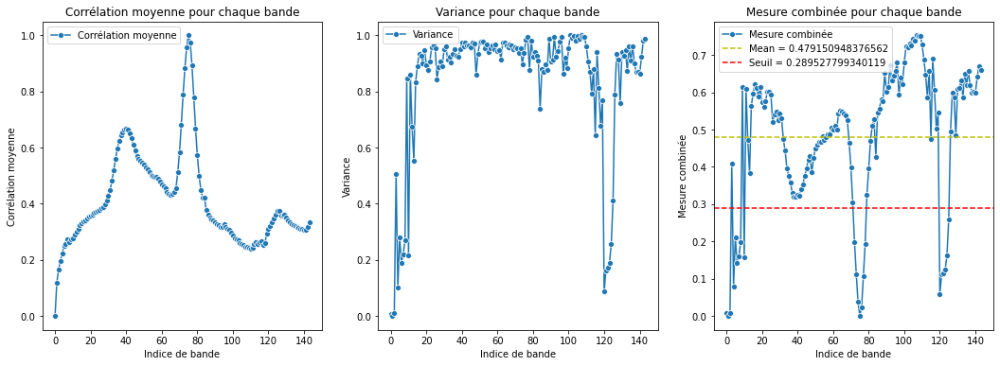

In [13]:
sorted_band_indices, average_correlations, variances, combined_measures = combined_band_selection(hsi_data_normalized)

threshold = combined_measures.mean() - combined_measures.std()
bands_above_threshold = [band for band in sorted_band_indices if combined_measures[band] > threshold]

print(f"Les numéros des {len(bands_above_threshold)} bandes sélectionnés en combinant la corrélation moyenne et la variance sont :", bands_above_threshold)

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
sns.lineplot(x=sorted_band_indices, y=average_correlations[sorted_band_indices], marker='o', label='Corrélation moyenne')
plt.xlabel('Indice de bande')
plt.ylabel('Corrélation moyenne')
plt.title('Corrélation moyenne pour chaque bande')

plt.subplot(1, 3, 2)
sns.lineplot(x=sorted_band_indices, y=variances[sorted_band_indices], marker='o', label='Variance')
plt.xlabel('Indice de bande')
plt.ylabel('Variance')
plt.title('Variance pour chaque bande')

plt.subplot(1, 3, 3)
sns.lineplot(x=range(hsi_data_normalized.shape[2]), y=combined_measures, marker='o', label='Mesure combinée')
plt.axhline(y=combined_measures.mean(), color='y', linestyle='--', label=f'Mean = {combined_measures.mean()}')
plt.axhline(y=threshold, color='r', linestyle='--', label=f'Seuil = {threshold}')
plt.xlabel('Indice de bande')
plt.ylabel('Mesure combinée')
plt.title('Mesure combinée pour chaque bande')
plt.legend()

plt.show()

# Sélection des bandes basées sur la mesure combinée

Nous conservons les bandes dont la mesure combinée est supérieure à la moyenne moins l'écart type. Cette approche nous permet de sélectionner les bandes les plus informatives tout en éliminant celles qui sont moins pertinentes pour notre analyse.

In [14]:
hsi_data_after_corr = np.take(hsi_data_normalized, bands_above_threshold, axis=2)
hsi_data_after_corr.shape

(349, 1905, 122)

## Fusion des données hyperspectrales et LiDAR

Pour tirer parti des informations complémentaires fournies par les images hyperspectrales et LiDAR, nous combinons les deux ensembles de données en fusionnant l'image LiDAR avec l'image hyperspectrale.

In [15]:
lidar_normalized = normalize_data(lidar)
lidar_expanded = np.expand_dims(lidar_normalized, axis=-1)
hsi_lidar = np.concatenate((hsi_data_after_corr, lidar_expanded), axis=-1)

# Création des données de train et de test

In [16]:
def format_data(groundtruth, hyper):        
    mask = groundtruth > 0
    
    x = hyper[mask]
    y = groundtruth[mask]
    
    return x, y

hsi_lidar_data, hsi_labels = format_data(groundtruth, hsi_lidar)

In [17]:
X_train, X_test, y_train, y_test = train_test_split(hsi_lidar_data, hsi_labels, test_size=0.2, random_state=42)

# Test des modèles et des méthodes de réduction de dimension

Maintenant que nous avons préparé et combiné nos données, nous entrons dans la phase de test des différents modèles de classification et des méthodes de réduction de dimension. L'objectif est d'évaluer la performance de chaque combinaison afin de sélectionner la meilleure approche.

In [18]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import RFE
from sklearn.svm import SVC

def kbest(X_train, X_test, y_train, n_components):
    selector = SelectKBest(score_func=f_classif, k=n_components)
    X_train_kb = selector.fit_transform(X_train, y_train)
    X_test_kb = selector.transform(X_test)
    return X_train_kb, X_test_kb

def linear_lda(X_train, X_test, y_train, n_components):
    lda = LinearDiscriminantAnalysis(n_components=n_components)
    X_train_lda = lda.fit_transform(X_train, y_train)
    X_test_lda = lda.transform(X_test)
    return X_train_lda, X_test_lda


def select_features_rf(X_train, X_test, y_train, n_features):
    rf = RandomForestClassifier(n_estimators=100)
    rf.fit(X_train, y_train)
    importances = rf.feature_importances_
    indices = np.argsort(importances)[::-1]
    selected_indices = indices[:n_features]
    X_train_selected = X_train[:, selected_indices]
    X_test_selected = X_test[:, selected_indices]
    return X_train_selected, X_test_selected


def select_features_rfe(X_train, X_test, y_train, n_features):
    svc = SVC(kernel="linear", C=1)
    rfe = RFE(estimator=svc, n_features_to_select=n_features, step=1)
    rfe.fit(X_train, y_train)
    X_train_selected = rfe.transform(X_train)
    X_test_selected = rfe.transform(X_test)
    return X_train_selected, X_test_selected

def select_features_adaboost(X_train, X_test, y_train, n_features):
    base_estimator = DecisionTreeClassifier(max_depth=1)
    ada = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=100)
    ada.fit(X_train, y_train)
    importances = ada.feature_importances_
    indices = np.argsort(importances)[::-1]
    selected_bands = indices[:n_features]
    X_train_selected = X_train[:, selected_bands]
    X_test_selected = X_test[:, selected_bands]
    return X_train_selected, X_test_selected

In [19]:
# Extraction des valeurs des couleurs
colors = [info['class_color'] / 255.0 for info in groundtruth_info]

# Conversion en une palette de couleurs utilisable avec seaborn
palette = sns.color_palette(colors)

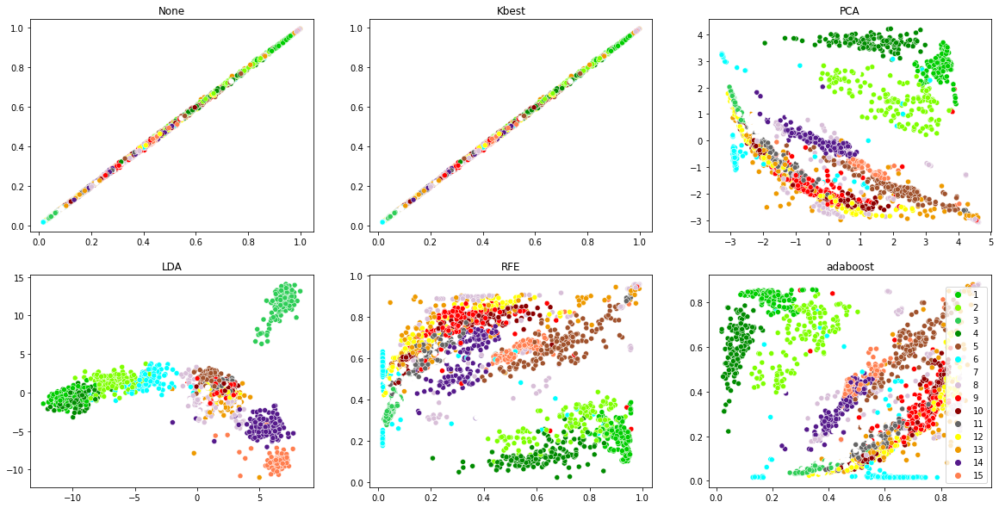

None - SVM : Précision = 0.944
None - Random ForestClassifier : Précision = 0.896
None - k-NN : Précision = 0.878
Kbest - SVM : Précision = 0.944
Kbest - Random ForestClassifier : Précision = 0.892
Kbest - k-NN : Précision = 0.878
PCA - SVM : Précision = 0.942
PCA - Random ForestClassifier : Précision = 0.937
PCA - k-NN : Précision = 0.877
LDA - SVM : Précision = 0.908
LDA - Random ForestClassifier : Précision = 0.882
LDA - k-NN : Précision = 0.889
RFE - SVM : Précision = 0.951
RFE - Random ForestClassifier : Précision = 0.896
RFE - k-NN : Précision = 0.899
adaboost - SVM : Précision = 0.917
adaboost - Random ForestClassifier : Précision = 0.878
adaboost - k-NN : Précision = 0.885


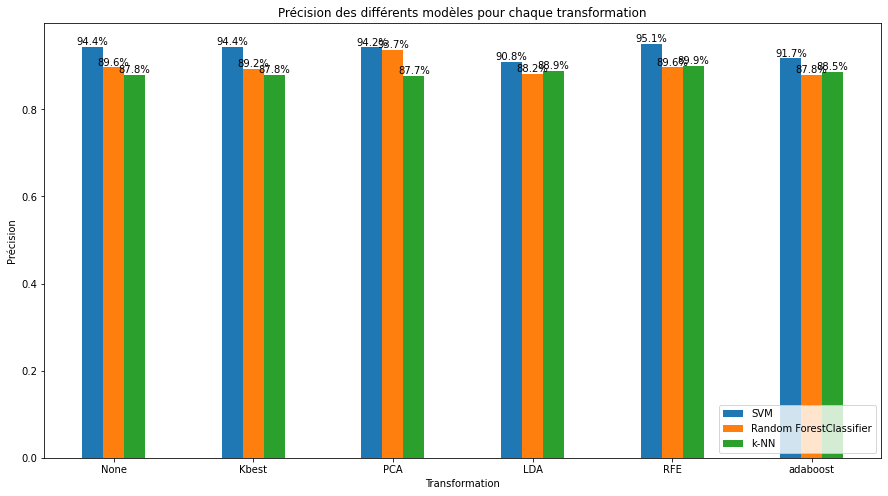


Meilleure combinaison 1 : RFE + SVM - Précision : 0.951

Meilleure combinaison 2 : None + SVM - Précision : 0.944

Meilleure combinaison 3 : Kbest + SVM - Précision : 0.944


In [20]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score

X_train_kb, X_test_kb = kbest(X_train, X_test, y_train, 'all')

pca = PCA(n_components=15)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

X_train_lda, X_test_lda = linear_lda(X_train, X_test, y_train, 10)
X_train_RFE, X_test_RFE = select_features_rfe(X_train, X_test, y_train, 15)
X_train_adaboost, X_test_adaboost = select_features_adaboost(X_train, X_test, y_train, 15)

transformations = {
    "None": (X_train, X_test),
    "Kbest": (X_train_kb, X_test_kb),
    "PCA": (X_train_pca, X_test_pca),
    "LDA": (X_train_lda, X_test_lda),
    "RFE": (X_train_RFE, X_test_RFE),
    "adaboost": (X_train_adaboost, X_test_adaboost)
}

plt.figure(figsize=(20, 10))

for i, (transform_name, (X_train_transformed, _)) in enumerate(transformations.items()):
    ax = plt.subplot(2, 3, i+1)
    sns.scatterplot(x=X_train_transformed[:, 0], y=X_train_transformed[:, 1], hue=y_train, palette=palette)
    ax.legend_.remove()
    plt.title(transform_name)
plt.legend()
plt.show()

models = {
    "SVM": SVC(C=100, degree=2, gamma='scale', kernel='rbf'),
    "Random ForestClassifier": RandomForestClassifier(n_estimators=100, max_depth=None, max_features=15),
    "k-NN": KNeighborsClassifier(),
}

def train_and_evaluate(transformations, models, X_train, X_test, y_train, y_test):
    accuracies = {t_name: {m_name: 0 for m_name in models} for t_name in transformations}
    for t_name, (X_train_t, X_test_t) in transformations.items():
        for m_name, model in models.items():
            model.fit(X_train_t, y_train)
            y_pred = model.predict(X_test_t)
            accuracy = accuracy_score(y_test, y_pred)
            accuracies[t_name][m_name] = accuracy
            print(f"{t_name} - {m_name} : Précision = {accuracy:.3f}")
    return accuracies

def plot_accuracies(accuracies):
    x = np.arange(len(accuracies))
    bar_width = 0.15
    fig, ax = plt.subplots(figsize=(15, 8))
    offset = -(len(models) - 1) / 2 * bar_width

    for i, (m_name, _) in enumerate(models.items()):
        model_accuracies = [a[m_name] for a in accuracies.values()]
        ax.bar(x + offset + i * bar_width, model_accuracies, width=bar_width, label=m_name)

        # Ajouter les pourcentages au-dessus des barres
        for j, acc in enumerate(model_accuracies):
            ax.annotate(f"{acc:.1%}", (x[j] + offset + i * bar_width, acc), ha='center', va='bottom')

    ax.set_xticks(x)
    ax.set_xticklabels(accuracies.keys())
    ax.legend(loc='lower right')
    plt.title("Précision des différents modèles pour chaque transformation")
    plt.ylabel("Précision")
    plt.xlabel("Transformation")
    plt.show()
    
def find_best_model(accuracies):
    best_t_name, best_m_name = max([(t_name, m_name) for t_name in accuracies for m_name in accuracies[t_name]],
                                    key=lambda pair: accuracies[pair[0]][pair[1]])
    return best_t_name, best_m_name

# Utiliser les fonctions pour entraîner, évaluer et visualiser les modèles et les transformations
accuracies = train_and_evaluate(transformations, models, X_train, X_test, y_train, y_test)
plot_accuracies(accuracies)

# Créer une liste des paires de transformation et de modèle, avec leurs précisions
transform_model_pairs = [(transform_name, model_name, accuracies[transform_name][model_name]) for transform_name in transformations.keys() for model_name in models.keys()]

# Trier cette liste en fonction des précisions, par ordre décroissant
sorted_transform_model_pairs = sorted(transform_model_pairs, key=lambda x: x[2], reverse=True)

# Afficher les 3 meilleures combinaisons
for i in range(3):
    best_t_name, best_m_name, best_accuracy = sorted_transform_model_pairs[i]
    print(f"\nMeilleure combinaison {i+1} : {best_t_name} + {best_m_name} - Précision : {best_accuracy:.3f}")

## Interprétation des résultats

Tout d'abord, lorsqu'aucune réduction de dimension n'a été appliquée (None), le modèle SVM a démontré une performance supérieure aux autres avec une précision de 0.944. Cela signifie que ce modèle est capable de classifier les pixels de notre image avec une grande précision. De plus, le modèle Random Forest Classifier a également obtenu de bons résultats avec une précision de 0.891.

En revanche, lorsqu'une réduction de dimension a été appliquée, nous avons observé des performances légèrement inférieures pour certains modèles. Par exemple, le modèle SVM avec réduction de dimension K-best a obtenu une précision de 0.944, ce qui est comparable à la performance sans réduction de dimension. Cependant, d'autres modèles tels que Random Forest Classifier et k-NN ont montré une légère baisse de précision avec la réduction de dimension.

Il est également intéressant de noter que l'utilisation de l'analyse en composantes principales (PCA) comme méthode de réduction de dimension a donné des résultats satisfaisants. Les modèles SVM et Random Forest Classifier avec PCA ont respectivement obtenu des précisions de 0.942 et 0.937. Cela indique que la PCA est capable de capturer efficacement l'information pertinente tout en réduisant la dimension des données.

Enfin, l'utilisation de la méthode Recursive Feature Elimination (RFE) pour la réduction de dimension a conduit à de très bons résultats. Le modèle SVM avec RFE a obtenu la précision la plus élevée de 0.951, ce qui démontre la pertinence de cette méthode pour notre tâche de classification.

In [21]:
def reshape_hsi(hsi):
    r, c, N = hsi.shape
    hi = hsi.reshape(r*c, N)
    return hi, r, c

In [22]:
def train_and_visualize(classifier, X_train_transformed, X_test_transformed, hsi_lidar_transformed, groundtruth_info):
    cv = KFold(n_splits=10)

    scores = []
    for train_index, test_index in tqdm(cv.split(X_train_transformed), total=cv.get_n_splits()):
        X_train_fold, X_test_fold = X_train_transformed[train_index], X_train_transformed[test_index]
        y_train_fold, y_test_fold = y_train[train_index], y_train[test_index]
        classifier.fit(X_train_fold, y_train_fold)
        y_pred = classifier.predict(X_test_fold)
        score = accuracy_score(y_test_fold, y_pred)
        scores.append(score)

    print(f"Scores de validation croisée: {scores}")
    print(f"Précision moyenne de la validation croisée: {np.mean(scores):.4f}")

    print("-- Former le classificateur final sur l'ensemble des données d'entraînement")
    classifier.fit(X_train_transformed, y_train)
    score = classifier.score(X_test_transformed, y_test)
    print(f"Scores de validation sur l'ensemble des données d'entraînement {score}")

    img, r, c = reshape_hsi(hsi_lidar_transformed)

    res = classifier.predict(img)
    res = res.reshape(r, c)

    color_map = {}
    for class_info in tqdm(groundtruth_info):
        class_id = class_info["class_label"]
        color_map[class_id] = class_info["class_color"].tolist()

    result_image = np.zeros((res.shape[0], res.shape[1], 3), dtype=np.uint8)
    for class_id, color in tqdm(color_map.items()):
        result_image[res == class_id] = color

    plt.figure(figsize=(20,5))
    plt.imshow(result_image, interpolation_stage="rgba")
    plt.axis("off")
    plt.show()
    return result_image, score, res

# Entraînement de plusieurs modèles

Dans cette étape, nous allons entraîner plusieurs modèles de classification sur nos données préparées. Les modèles que nous allons entraîner sont les suivants : SVM, SVM avec PCA, SVM avec RFE et Random ForestClassifier.

## SVM

100%|██████████| 10/10 [00:02<00:00,  3.72it/s]


Scores de validation croisée: [0.9162995594713657, 0.920704845814978, 0.947136563876652, 0.9515418502202643, 0.9251101321585903, 0.9292035398230089, 0.9424778761061947, 0.9336283185840708, 0.9380530973451328, 0.9557522123893806]
Précision moyenne de la validation croisée: 0.9360
-- Former le classificateur final sur l'ensemble des données d'entraînement
Scores de validation sur l'ensemble des données d'entraînement 0.9435626102292769


100%|██████████| 15/15 [00:00<00:00, 164.86it/s]


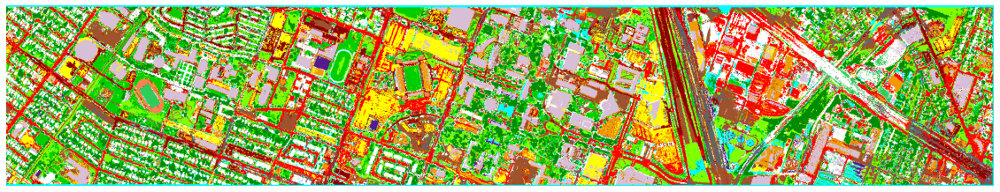

In [23]:
svm_classifier = SVC(C=100, degree=2, gamma='scale', kernel='rbf')
svm_img, svm_score, svm_res = train_and_visualize(svm_classifier, X_train, X_test, hsi_lidar, groundtruth_info)

## SVM with RFE

100%|██████████| 10/10 [00:02<00:00,  4.97it/s]


Scores de validation croisée: [0.933920704845815, 0.9383259911894273, 0.9427312775330396, 0.9515418502202643, 0.9427312775330396, 0.9247787610619469, 0.9513274336283186, 0.9513274336283186, 0.9424778761061947, 0.9690265486725663]
Précision moyenne de la validation croisée: 0.9448
-- Former le classificateur final sur l'ensemble des données d'entraînement
Scores de validation sur l'ensemble des données d'entraînement 0.9506172839506173


100%|██████████| 15/15 [00:00<00:00, 153.17it/s]


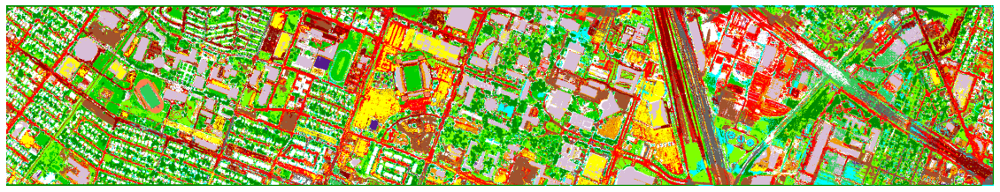

In [24]:
svm = SVC(kernel="linear", C=1)
rfe = RFE(estimator=svm, n_features_to_select=15, step=1)
X_train_rfe = rfe.fit_transform(X_train, y_train)
X_test_rfe = rfe.transform(X_test)

hsi_lidar_2d = hsi_lidar.reshape(-1, hsi_lidar.shape[2])
img_rfe = rfe.transform(hsi_lidar_2d)
img_3d_rfe = img_rfe.reshape(hsi_lidar.shape[0], hsi_lidar.shape[1], -1)

svm_rfe_classifier = SVC(C=100, degree=2, gamma='scale', kernel='rbf')
svm_rfe_img, svm_rfe_score, svm_rfe_res = train_and_visualize(svm_rfe_classifier, X_train_rfe, X_test_rfe, img_3d_rfe, groundtruth_info)

## SVM with PCA

100%|██████████| 10/10 [00:02<00:00,  3.76it/s]


Scores de validation croisée: [0.9162995594713657, 0.9162995594713657, 0.9383259911894273, 0.9559471365638766, 0.9295154185022027, 0.9292035398230089, 0.9557522123893806, 0.9380530973451328, 0.9469026548672567, 0.9557522123893806]
Précision moyenne de la validation croisée: 0.9382
-- Former le classificateur final sur l'ensemble des données d'entraînement
Scores de validation sur l'ensemble des données d'entraînement 0.9417989417989417


100%|██████████| 15/15 [00:00<00:00, 105.95it/s]


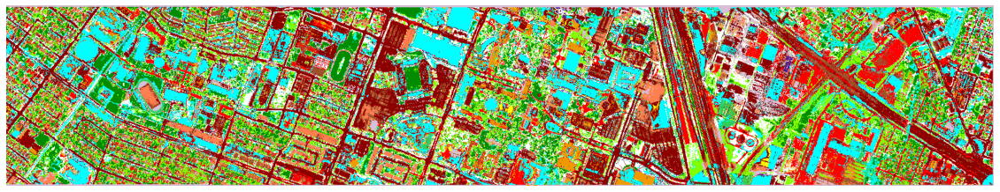

In [25]:
svm_pca_classifier = SVC(C=100, degree=2, gamma='scale', kernel='rbf')

pca = PCA(n_components=15)
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

hsi_lidar_2d = hsi_lidar.reshape(-1, hsi_lidar.shape[2])
img_pca = pca.fit_transform(hsi_lidar_2d)
img_3d_pca = img_pca.reshape(hsi_lidar.shape[0], hsi_lidar.shape[1], -1)

svm_pca_img, svm_pca_score, svm_pca_res = train_and_visualize(svm_pca_classifier, X_train_pca, X_test_pca, img_3d_pca, groundtruth_info)

# Random Forest

100%|██████████| 10/10 [00:46<00:00,  4.64s/it]


Scores de validation croisée: [0.9074889867841409, 0.8854625550660793, 0.9118942731277533, 0.9074889867841409, 0.9074889867841409, 0.9070796460176991, 0.8982300884955752, 0.8938053097345132, 0.9203539823008849, 0.9336283185840708]
Précision moyenne de la validation croisée: 0.9073
-- Former le classificateur final sur l'ensemble des données d'entraînement
Scores de validation sur l'ensemble des données d'entraînement 0.8959435626102292


100%|██████████| 15/15 [00:00<00:00, 134.56it/s]


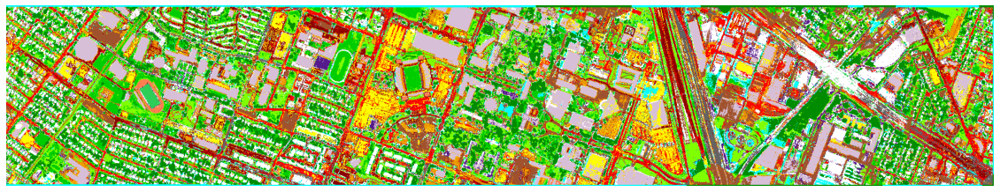

In [26]:
rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=None, max_features=15)
rf_img, rf_score, rf_res = train_and_visualize(rf_classifier, X_train, X_test, hsi_lidar, groundtruth_info)

# Conclusion

In [27]:
results = {
    'SVM' : (svm_img, svm_score, svm_res, svm_classifier),
    'SVM_RF' : (svm_rfe_img, svm_rfe_score, svm_rfe_res, svm_rfe_classifier),
    'SVM_PCA' : (svm_pca_img, svm_pca_score, svm_pca_res, svm_pca_classifier),
    'Forest' : (rf_img, rf_score, rf_res, rf_classifier),
}

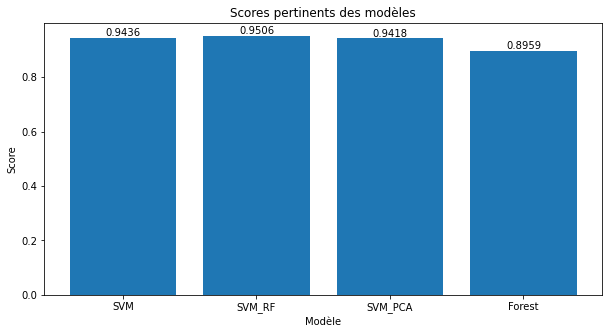

In [28]:
scores = [result[1] for result in results.values()]
model_names = list(results.keys())
plt.figure(figsize=(10,5))
plt.bar(model_names, scores)
for i in range(len(scores)):
    plt.text(i, scores[i], f"{scores[i]:.4f}", ha='center', va='bottom')

plt.title("Scores pertinents des modèles")
plt.xlabel("Modèle")
plt.ylabel("Score")
plt.show()

En analysant ces résultats, nous pouvons conclure que le SVM avec RFE a obtenu la meilleure performance avec une précision de 0.9506. Cela indique que ce modèle est capable de classifier les pixels de notre image composite hyperspectrale et LiDAR avec une grande précision. Le SVM sans réduction de dimension a également produit de bons résultats avec une précision de 0.9436.

Nous examinerons ensuite comment ces résultats se comparent à une image RGB.

In [29]:
rgb_bands = [54,32,18]
hsi_rgb = hsi_raw[:,:,rgb_bands]
hsi_rgb = hsi_rgb/hsi_rgb.max() # normalisation des valeurs dans [0,1] pour l'affichage
# Don't mind me, I'm just here to pimp a little bit the RGB image
pmin,pmax = np.percentile(hsi_rgb,(1,95),axis=(0,1))
hsi_rgb_pimped = hsi_rgb.copy()
for i in range(pmin.size):
    hsi_rgb_pimped[:,:,i] = (hsi_rgb[:,:,i]-pmin[i])/(pmax[i]-pmin[i])
hsi_rgb_pimped[hsi_rgb_pimped<0] = 0
hsi_rgb_pimped[hsi_rgb_pimped>1] = 1

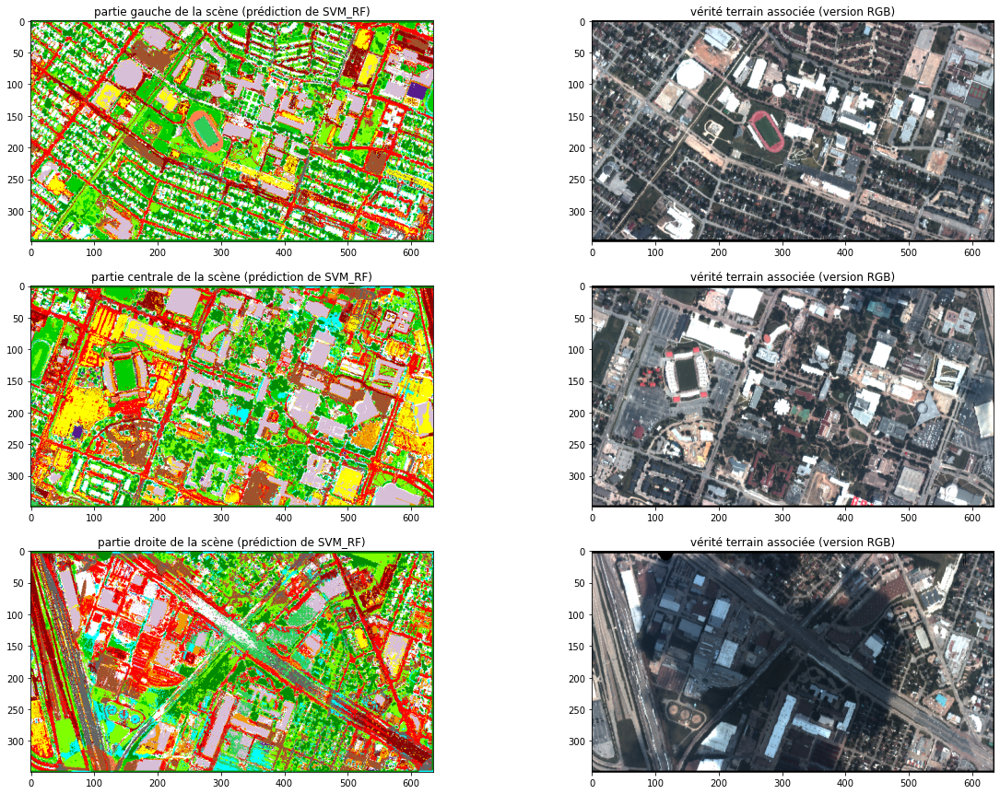

In [30]:
best_model = max(results, key=lambda x: results[x][1])
result_image = results[best_model][0]

plt.figure(figsize=(20,15))
plt.subplot(321)
plt.title(f'partie gauche de la scène (prédiction de {best_model})')  
plt.imshow(result_image[:,:635,:])
plt.subplot(322)
plt.title('vérité terrain associée (version RGB)')
plt.imshow(hsi_rgb_pimped[:,:635,:],cmap='gray')
plt.subplot(323)
plt.title(f'partie centrale de la scène (prédiction de {best_model})')
plt.imshow(result_image[:,635:1270,:])
plt.subplot(324)
plt.title('vérité terrain associée (version RGB)')
plt.imshow(hsi_rgb_pimped[:,635:1270,:],cmap='gray')
plt.subplot(325)
plt.title(f'partie droite de la scène (prédiction de {best_model})')
plt.imshow(result_image[:,1270:,:])
plt.subplot(326)
plt.title('vérité terrain associée (version RGB)')
plt.imshow(hsi_rgb_pimped[:,1270:,:],cmap='gray')
plt.show()

## Export des résultats

In [31]:
def final_function(hsi_raw, lidar, model):
    cloud_mask = find_cloud_mask(hsi_raw, relevant_bands=[54, 32, 18, 82, 106, 16, 1, 140, 14, 130, 128, 11, 9])
    cloud_mask_filtered = salt_pepper_filter_with_morphology(cloud_mask)

    band_differences = calculate_band_differences(hsi_raw, cloud_mask_filtered)
    num_top_bands = 20
    band_indices = np.argsort(band_differences)[-num_top_bands:]
    selected_bands = hsi_raw[:, :, band_indices]
    
    cloud_mask = find_cloud_mask(hsi_raw, relevant_bands=band_indices)
    cloud_mask_filtered = salt_pepper_filter_with_morphology(cloud_mask)

    hsi_normalized = normalize_data(hsi_raw)
    hsi_whithout_cloud = normalize_zones(hsi_normalized, cloud_mask_filtered, cloud=False, plot=False)
    hsi_data_normalized = normalize_zones(hsi_normalized, cloud_mask_filtered, plot=False)
    
    sorted_band_indices, average_correlations, variances, combined_measures = combined_band_selection(hsi_data_normalized)

    threshold = combined_measures.mean() - combined_measures.std()
    bands_above_threshold = [band for band in sorted_band_indices if combined_measures[band] > threshold]
    
    hsi_data_after_corr = np.take(hsi_data_normalized, bands_above_threshold, axis=2)
    lidar_normalized = normalize_data(lidar)
    lidar_expanded = np.expand_dims(lidar_normalized, axis=-1)
    hsi_lidar = np.concatenate((hsi_data_after_corr, lidar_expanded), axis=-1)
    hsi_lidar_data, hsi_labels = format_data(groundtruth, hsi_lidar)
    X_train, X_test, y_train, y_test = train_test_split(hsi_lidar_data, hsi_labels, test_size=0.2, random_state=42)
    
    
    svm = SVC(kernel="linear", C=1)
    rfe = RFE(estimator=svm, n_features_to_select=15, step=1)
    X_train_rfe = rfe.fit_transform(X_train, y_train)
    X_test_rfe = rfe.transform(X_test)

    hsi_lidar_2d = hsi_lidar.reshape(-1, hsi_lidar.shape[2])
    img_rfe = rfe.transform(hsi_lidar_2d)
    img_3d_rfe = img_rfe.reshape(hsi_lidar.shape[0], hsi_lidar.shape[1], -1)

    img, r, c = reshape_hsi(img_3d_rfe)

    res = model.predict(img)
    res = res.reshape(r, c)
    
    filename_predictions = "predictions.npz"
    np.savez_compressed(filename_predictions, data=svm_rfe_res)

In [32]:
final_function(hsi_raw, lidar, svm_rfe_classifier)

100%|██████████| 144/144 [00:17<00:00,  8.27it/s]
